In [1]:

import os 
os.environ['CUDA_VISIBLE_DEVICES'] = '7'

import numpy as np 

import torch
from torch.optim import Adam
from torch.nn import MSELoss

import matplotlib.pyplot as plt 

from dival.reconstructors.networks.unet import UNet
from dcp.utils.models import get_capsule_skip_model

from tqdm import tqdm
import torchvision
from skimage.metrics import peak_signal_noise_ratio, structural_similarity


from PIL import Image

In [2]:
def get_image(path):
    img_PIL = Image.open(path)
    ar = np.array(img_PIL)
    
    if len(ar.shape) == 3:
        ar = ar.transpose(2,0,1)
    else:
        ar = ar[None, ...]
        
    return ar.astype(np.float32) / 255.

def plot_image_grid(images_np, nrow = 8, factor = 1):
    
    n_channels = max(x.shape[0] for x in images_np)
    
    images_np = [x if (x.shape[0] == n_channels) else np.concatenate([x, x, x], axis=0) for x in images_np]
    
    images_torch = [torch.from_numpy(x) for x in images_np]
    grid = torchvision.utils.make_grid(images_torch, nrow).numpy() 
    
    plt.figure(figsize=(len(images_np) + factor, 12 + factor))
    
    if images_np[0].shape[0] == 1:
        plt.imshow(grid[0], cmap='gray')
    else:
        plt.imshow(grid.transpose(1, 2, 0))
    
    plt.show()
    
    return grid


def np_to_torch(img_np):
    '''Converts image in numpy.array to torch.Tensor.
    From C x W x H [0..1] to  C x W x H [0..1]
    '''
    return torch.from_numpy(img_np)[None, :]


def get_bernoulli_mask(for_image, zero_fraction=0.95):
    img_mask_np=(np.random.random_sample(size=for_image.shape) > zero_fraction).astype(int)
    
    return img_mask_np


In [3]:
base_path = "/home/adenker/CapsuleNet"

img_path  = os.path.join(base_path,'data/restoration/barbara.png')
#img_path  = os.path.join(base_path,'data/restoration/kate.png')



In [4]:

img = get_image(img_path)
img_mask = get_bernoulli_mask(img, 0.50)

img_torch = np_to_torch(img)
img_mask_torch = np_to_torch(img_mask)

print(img_torch.shape, img_mask.shape)

torch.Size([1, 1, 512, 512]) (1, 512, 512)


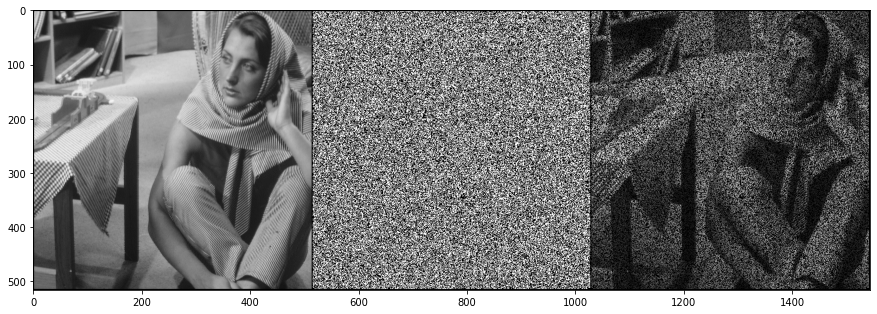

In [5]:
grid = plot_image_grid([img,img_mask, img*img_mask], factor=12)

In [9]:
#capsules = [[8, 2], [16, 2], [32, 2], [64, 2]]
capsules = [[8, 4], [16, 4], [16, 4], [16, 4]]

skip_capsules = [[4, 4], [4, 4], [4, 4], [16, 4]] 
scales = 4
eps = 1e-6
use_bias = True 
weight_init = 'xavier_uniform'
same_filter = False 
iter_rout = 1

input_depth = 1 
output_depth = 1
device = "cuda"

net_input = 0.1 * torch.randn(*img_torch.shape).to(device)


model = get_capsule_skip_model(
            input_depth,
            output_depth,
            capsules=capsules[:scales],
            skip_capsules=skip_capsules[:scales],
            iter_rout=iter_rout,
            weight_init=weight_init,
            same_filter=same_filter,
            use_bias=use_bias,
            eps=eps).to(device)

In [10]:
criterion = MSELoss()
optimizer = Adam(model.parameters(), lr=1e-3)

params_trainable = list(filter(lambda p: p.requires_grad, model.parameters()))

print("Number of trainable params: ", sum(p.numel() for p in params_trainable))


num_iters = 2000


Number of trainable params:  340268


  0%|          | 0/2000 [00:00<?, ?it/s]

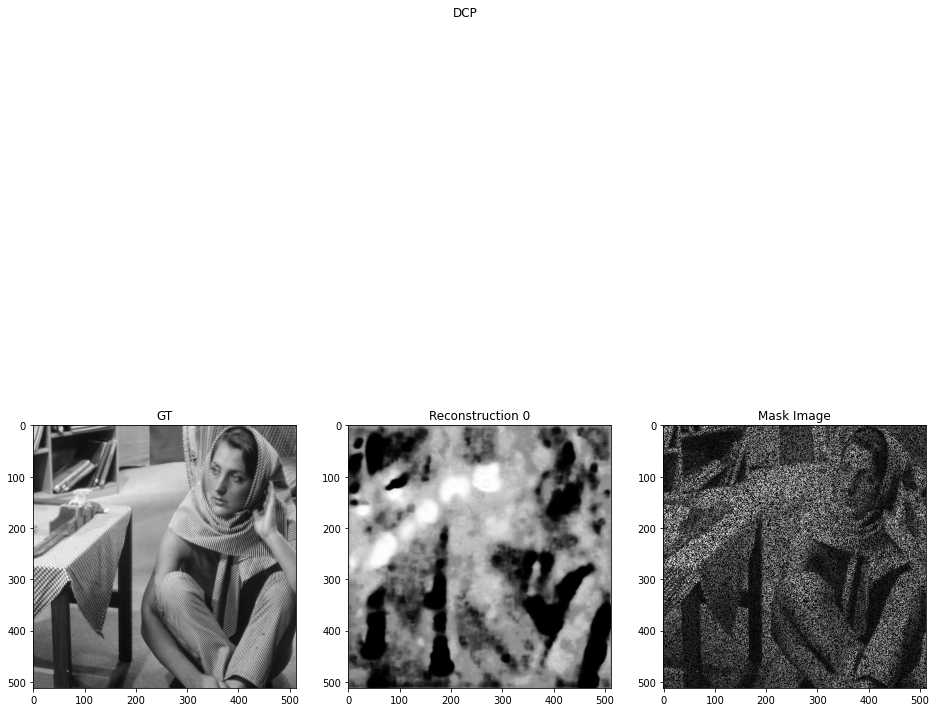

  5%|▌         | 100/2000 [00:14<04:23,  7.22it/s]

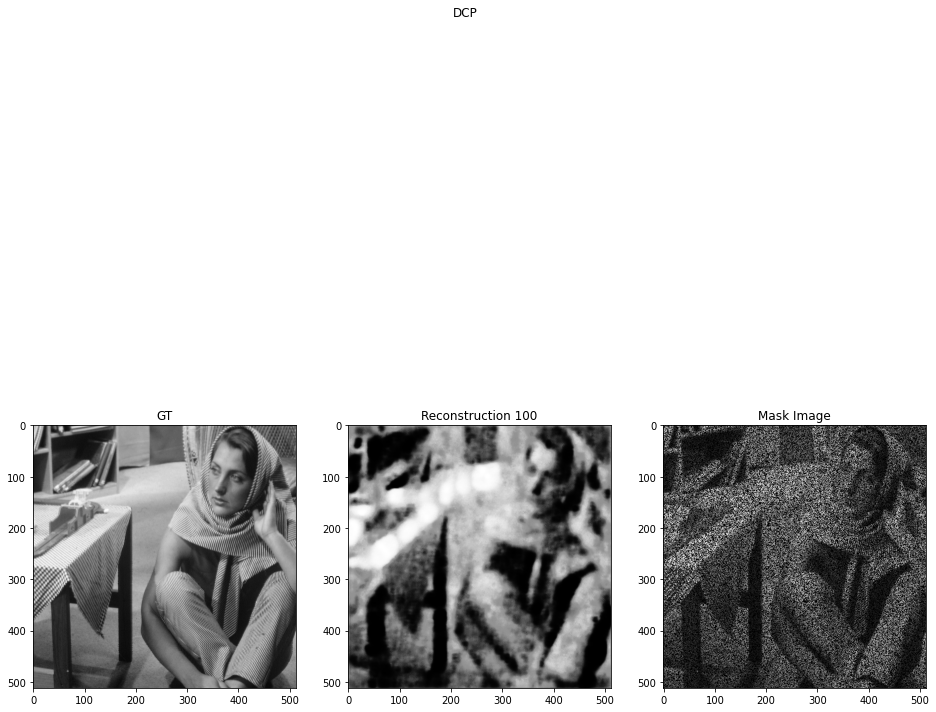

 10%|█         | 200/2000 [00:28<04:08,  7.23it/s]

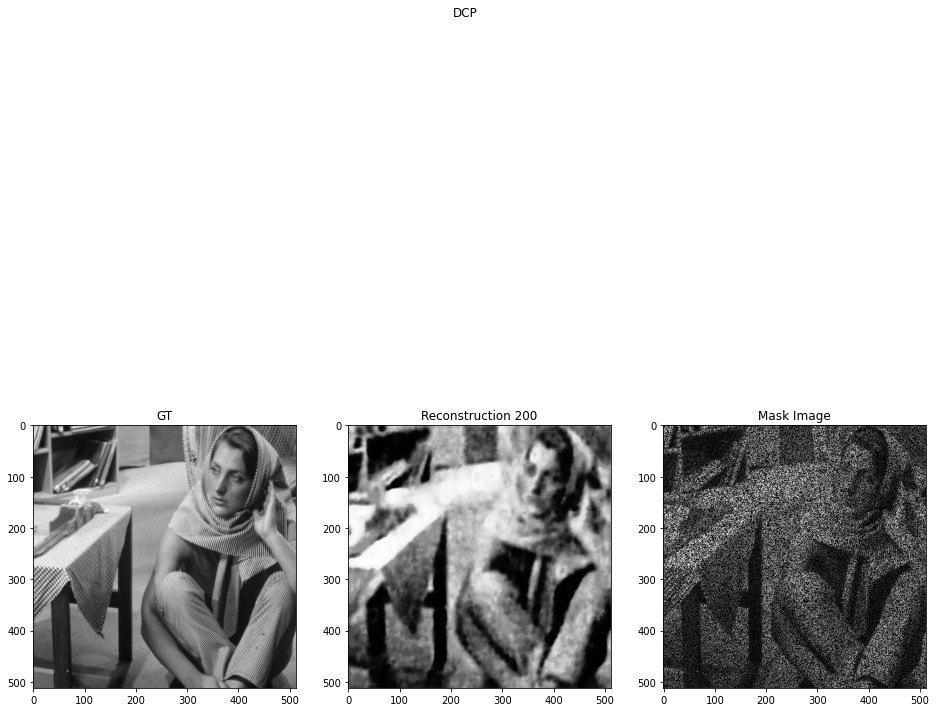

 15%|█▌        | 300/2000 [00:43<03:55,  7.22it/s]

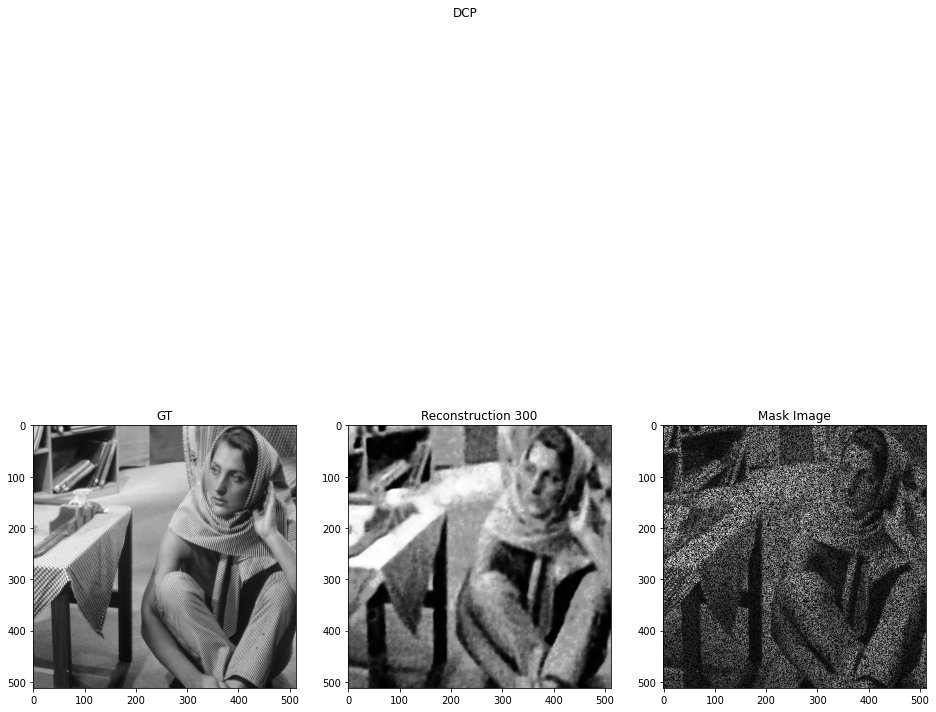

 20%|██        | 400/2000 [00:57<03:41,  7.21it/s]

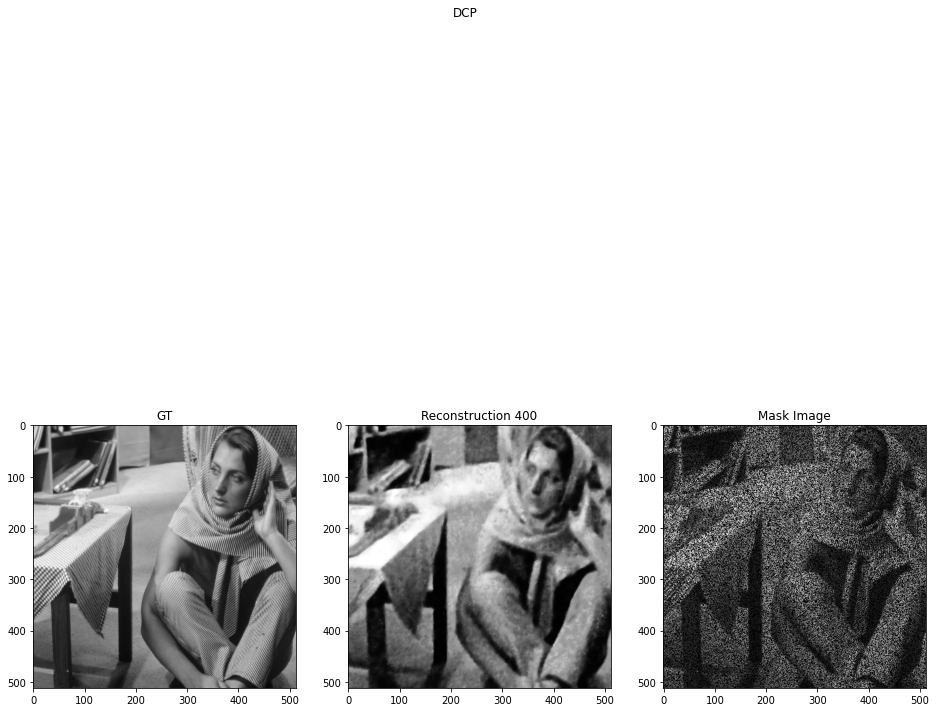

 25%|██▌       | 500/2000 [01:12<03:28,  7.21it/s]

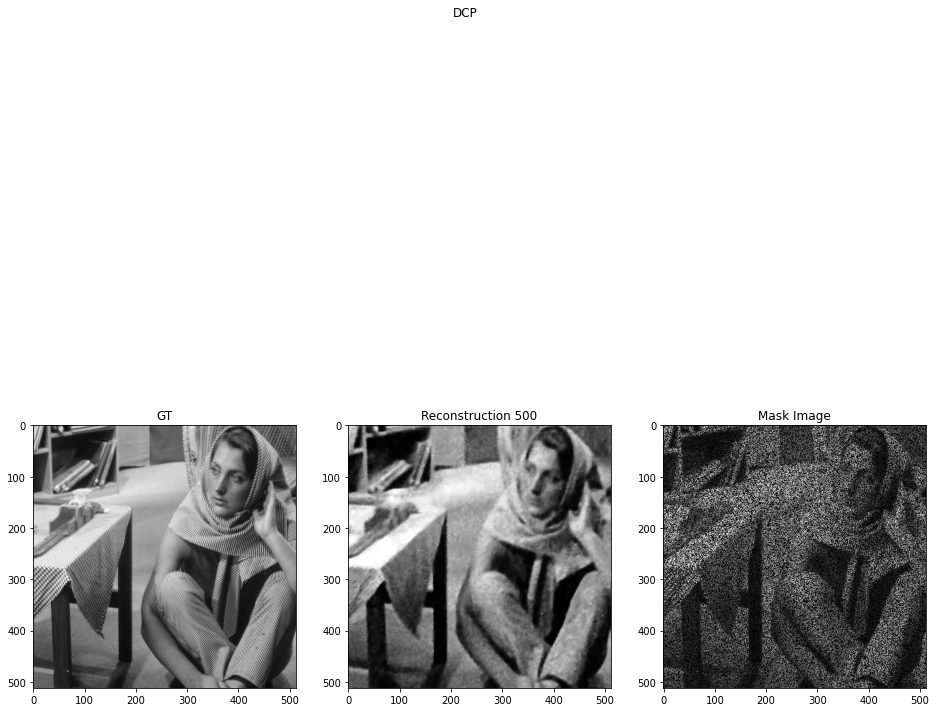

 30%|███       | 600/2000 [01:26<03:14,  7.20it/s]

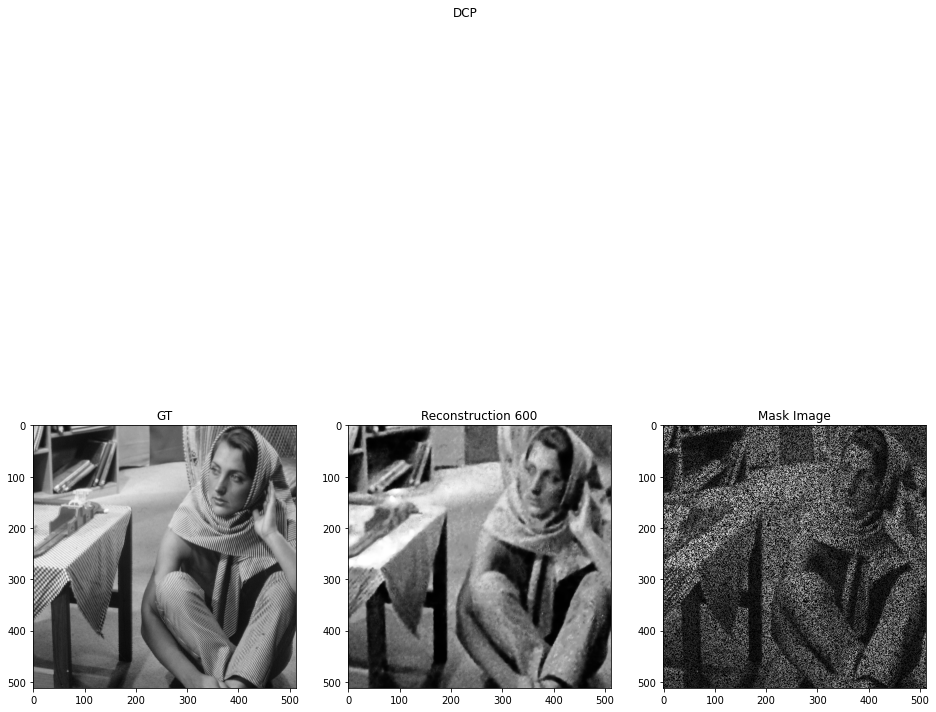

 35%|███▌      | 700/2000 [01:40<03:03,  7.09it/s]

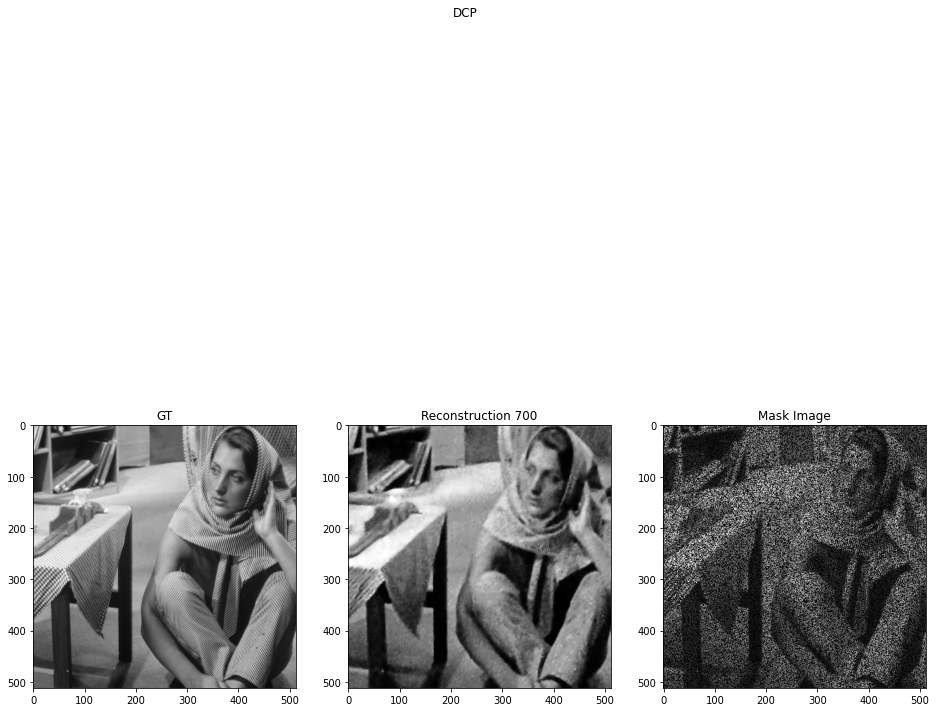

 40%|████      | 800/2000 [01:55<02:47,  7.17it/s]

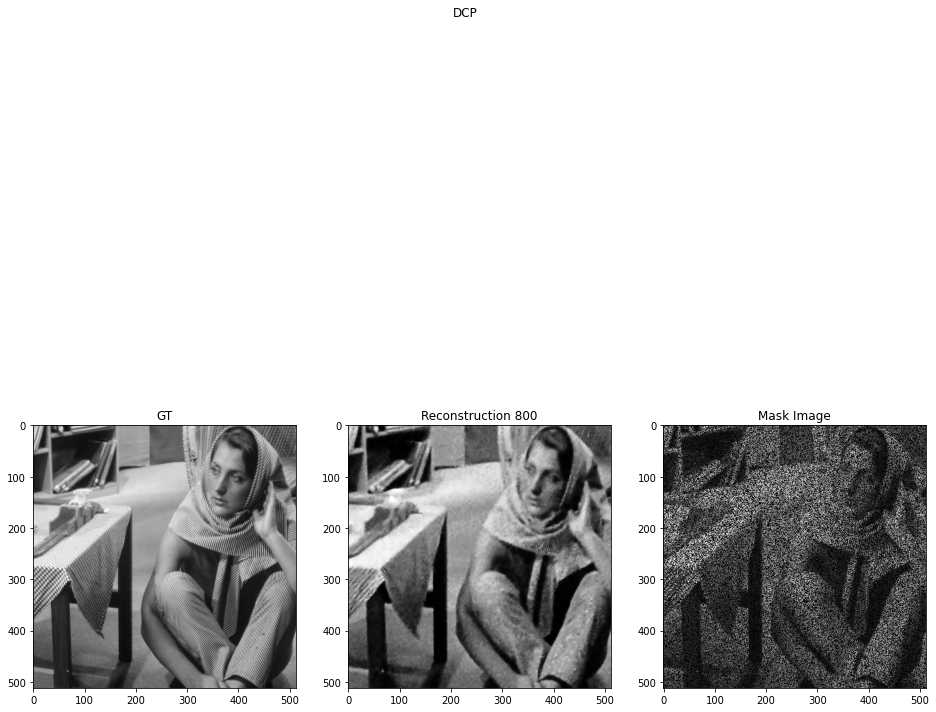

 45%|████▌     | 900/2000 [02:09<02:32,  7.19it/s]

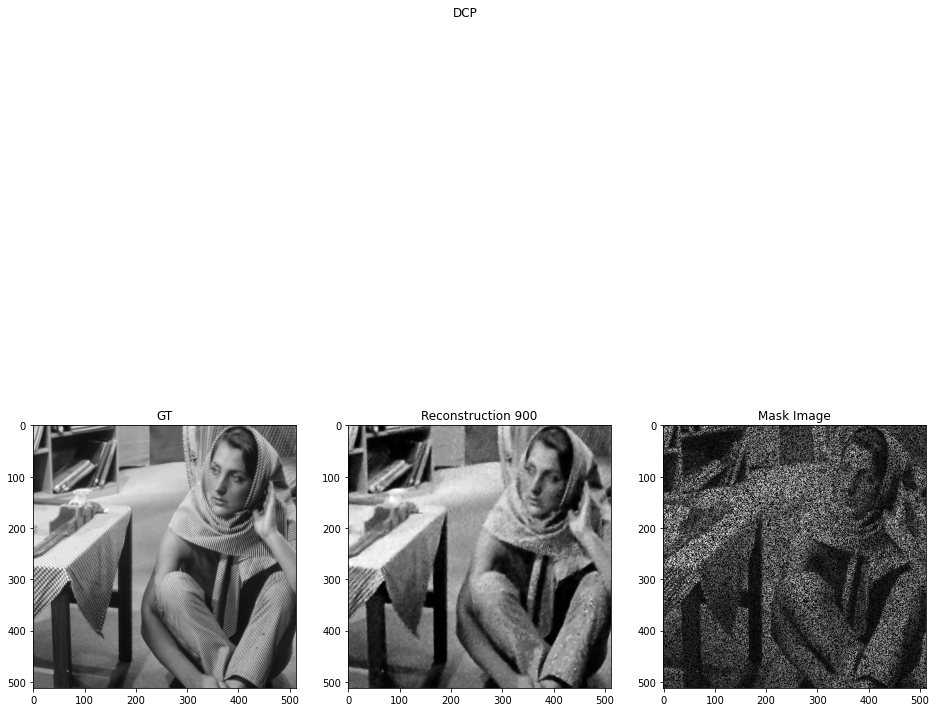

 50%|█████     | 1000/2000 [02:24<02:19,  7.16it/s]

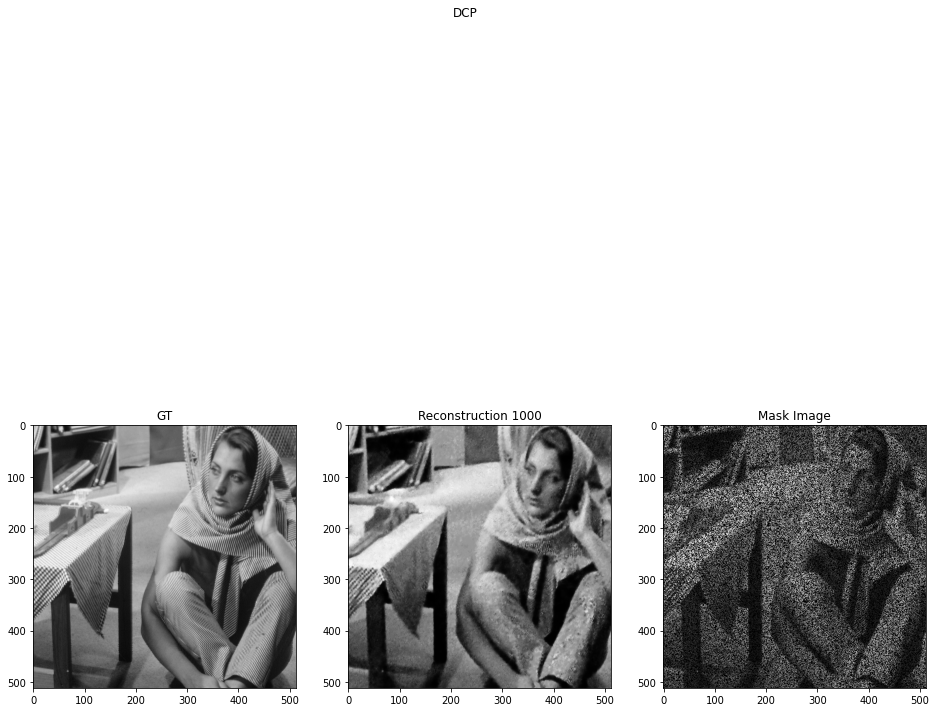

 55%|█████▌    | 1100/2000 [02:38<02:04,  7.21it/s]

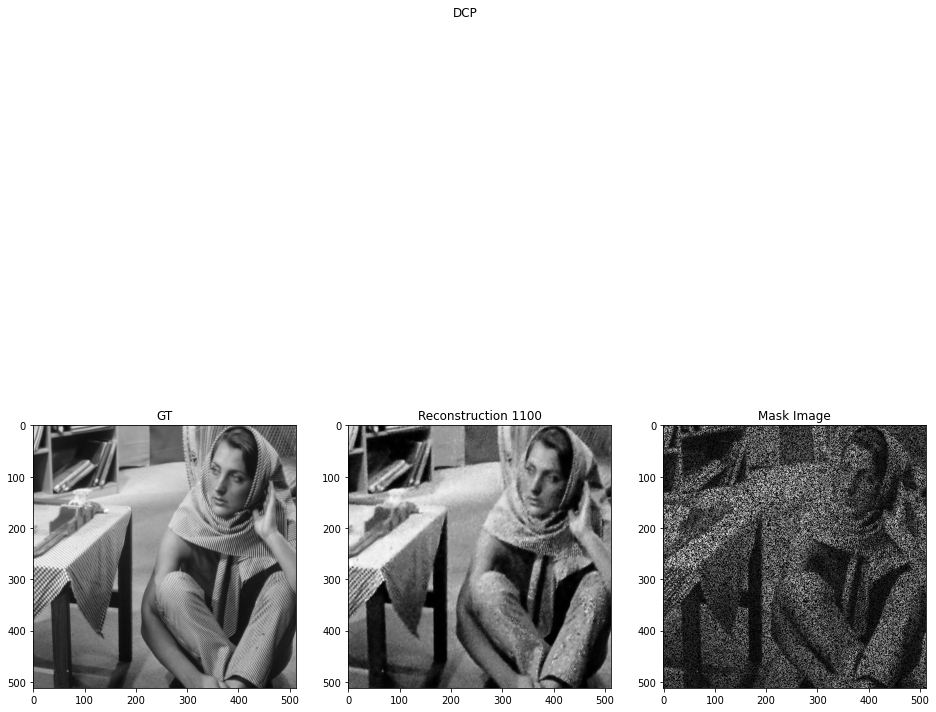

 60%|██████    | 1200/2000 [02:53<01:51,  7.19it/s]

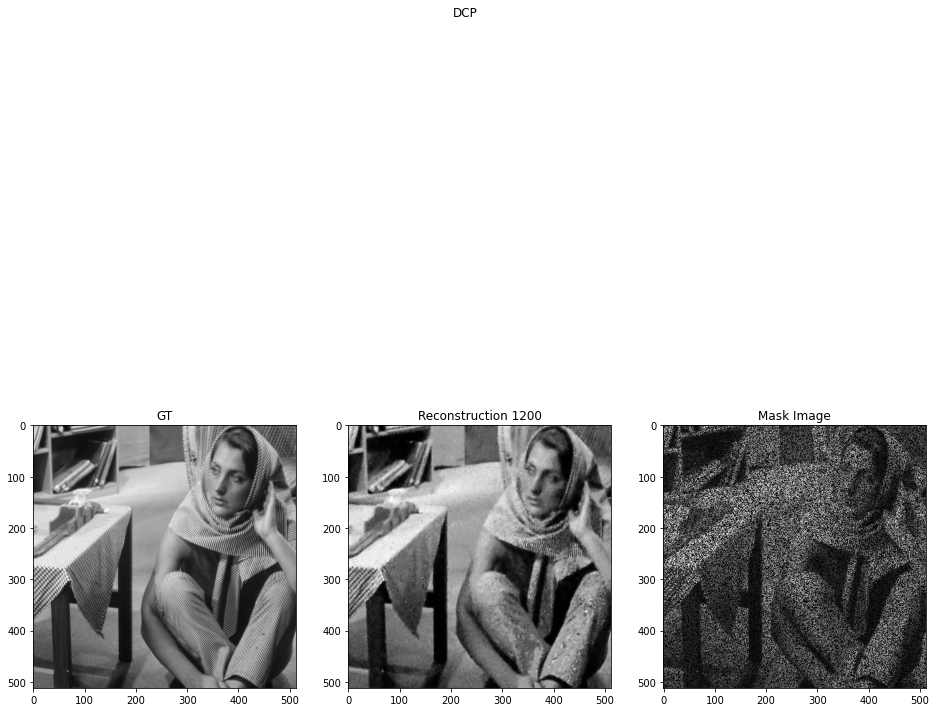

 65%|██████▌   | 1300/2000 [03:07<01:37,  7.19it/s]

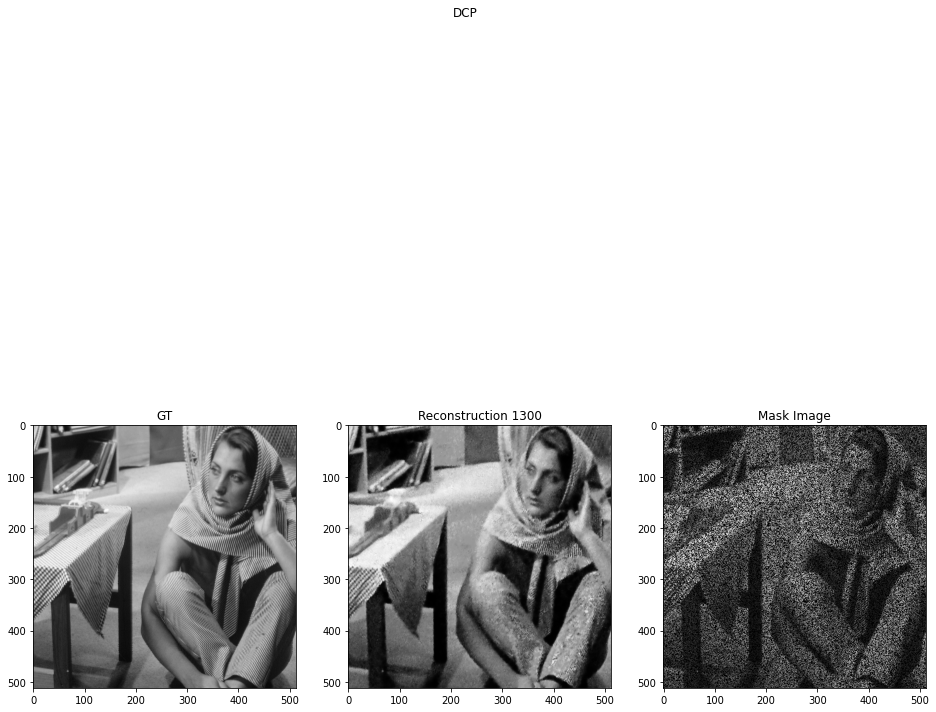

 70%|███████   | 1400/2000 [03:22<01:23,  7.18it/s]

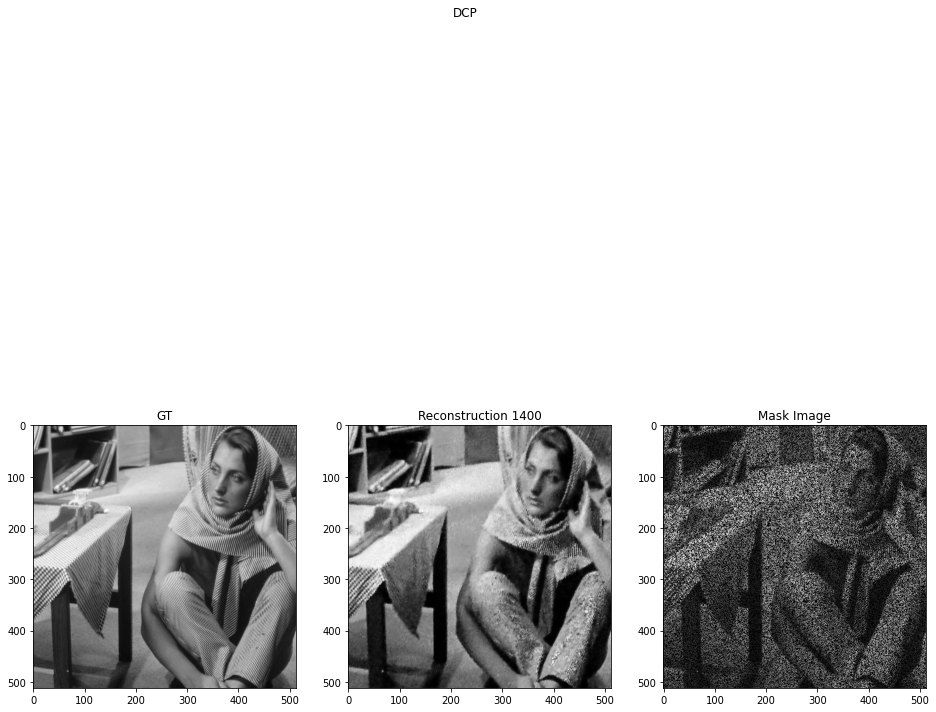

 75%|███████▌  | 1500/2000 [03:36<01:09,  7.21it/s]

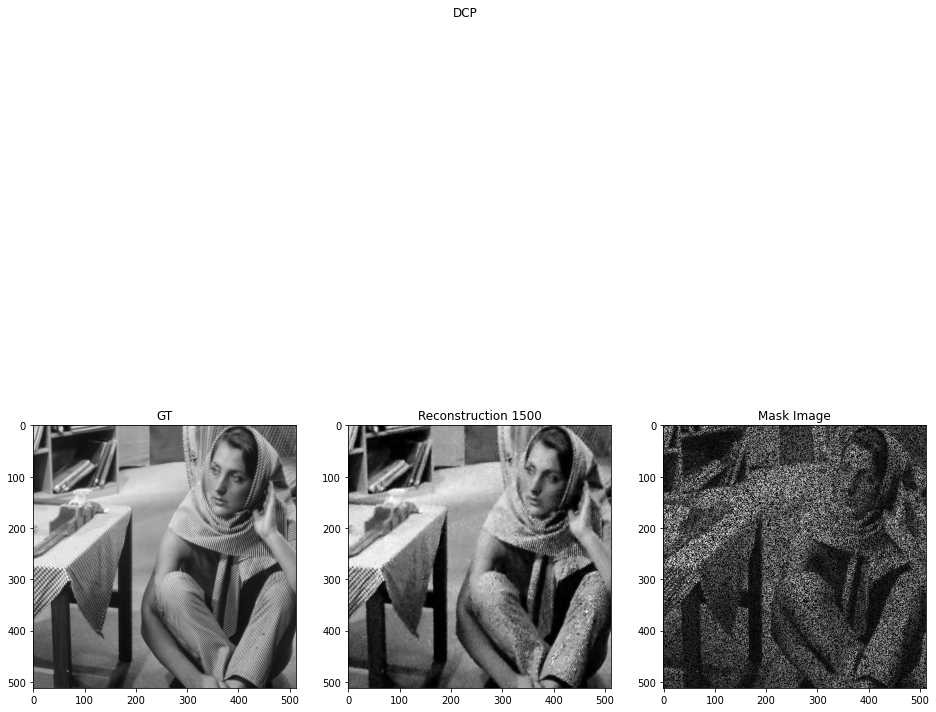

 80%|████████  | 1600/2000 [03:50<00:55,  7.20it/s]

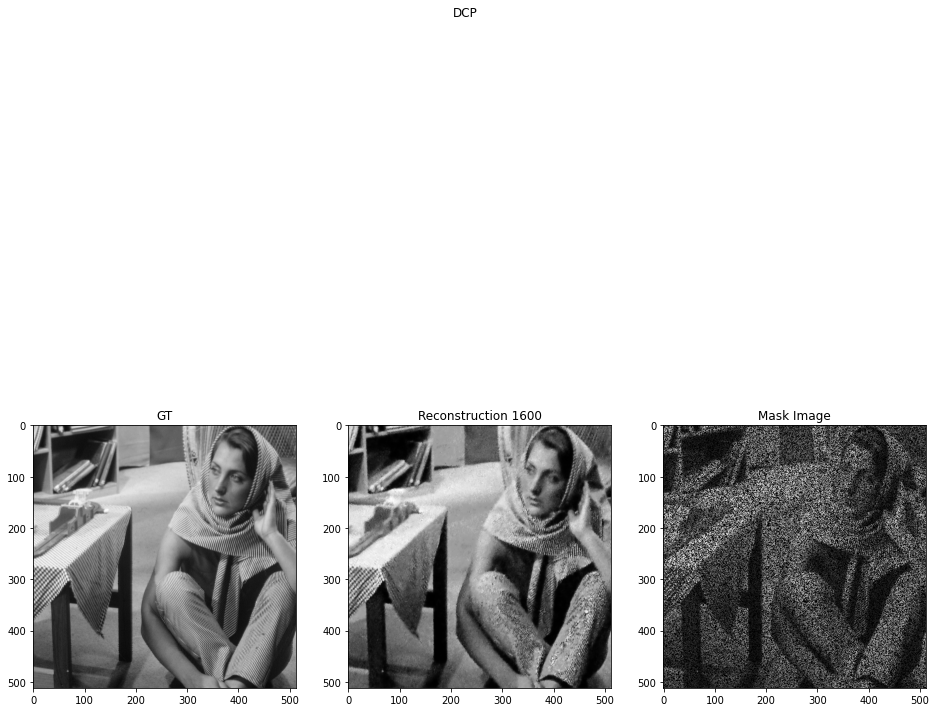

 85%|████████▌ | 1700/2000 [04:05<00:41,  7.21it/s]

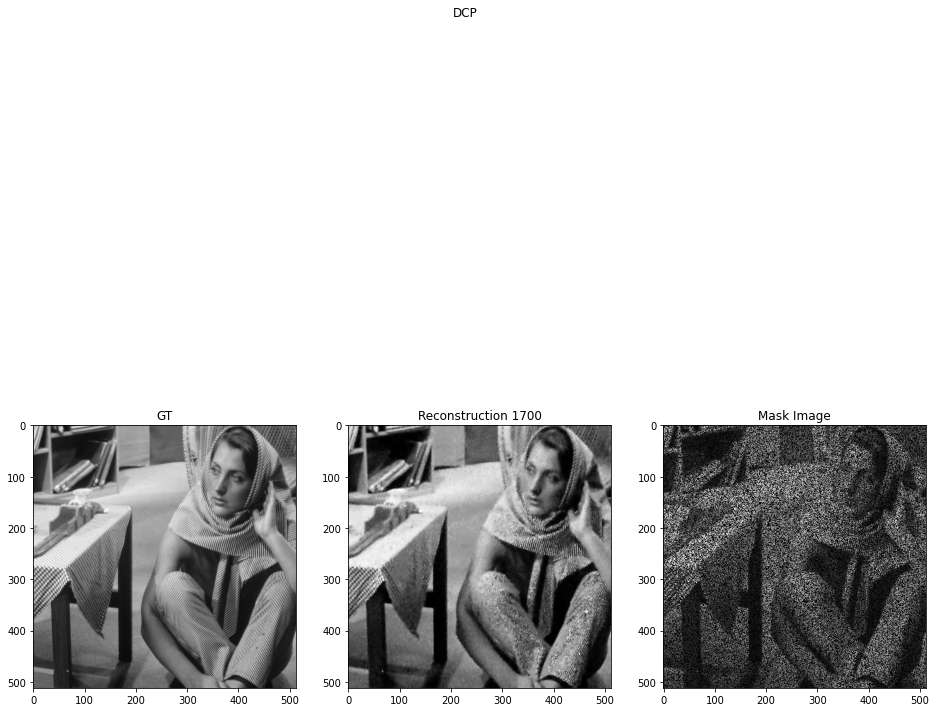

 90%|█████████ | 1800/2000 [04:19<00:27,  7.19it/s]

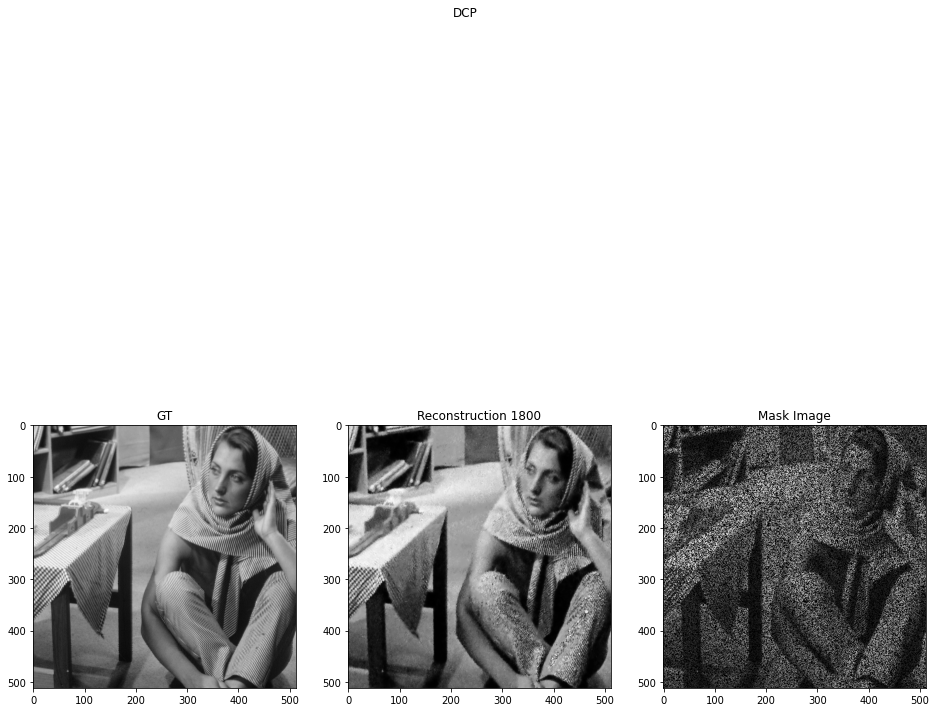

 95%|█████████▌| 1900/2000 [04:34<00:13,  7.21it/s]

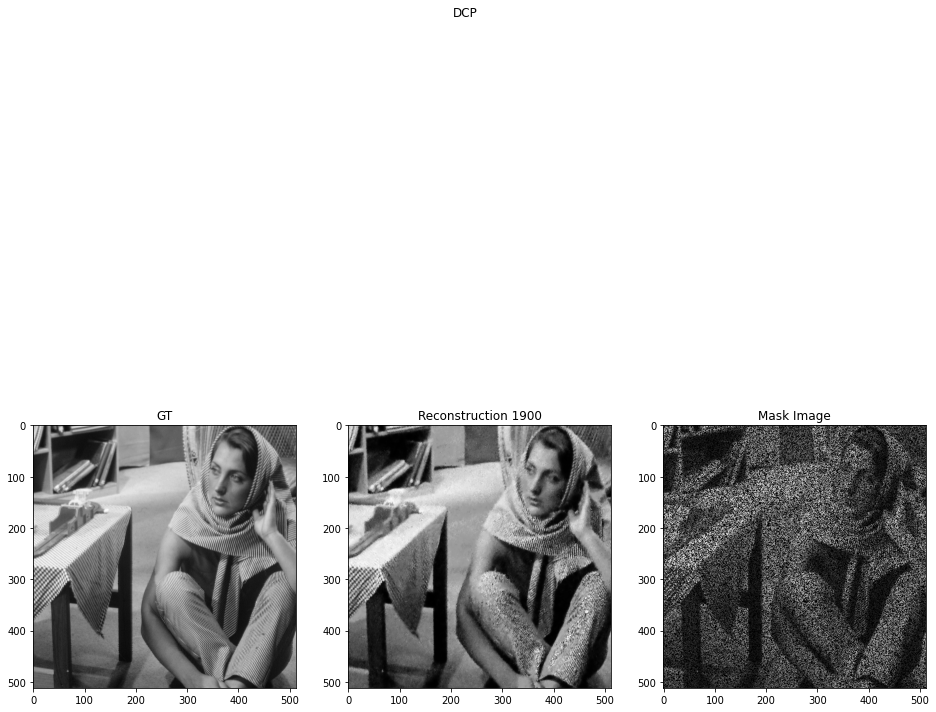

100%|██████████| 2000/2000 [04:48<00:00,  6.93it/s]


In [12]:
img_torch = img_torch.to(device).float()
img_mask_torch = img_mask_torch.to(device).float()

mse_loss = []
psnr_loss = [] 
ssim_loss = [] 
for i in tqdm(range(num_iters)):
    optimizer.zero_grad()

    _, out = model(net_input)

    loss = criterion(out*img_mask_torch, img_torch*img_mask_torch)

    loss.backward()
    #mse_loss.append(loss.item())
    
    ### psnr and ssim 
    pred = out.detach().cpu().numpy()[0].transpose(1, 2, 0)
    gt = img_torch.detach().cpu().numpy()[0].transpose(1, 2, 0)
    #psnr = peak_signal_noise_ratio(gt, pred, data_range=np.max(gt) - np.min(gt))
    #ssim = structural_similarity(gt, pred,multichannel=True, data_range=np.max(gt) - np.min(gt))

    #psnr_loss.append(psnr)
    #ssim_loss.append(ssim)

    optimizer.step()

    if i % 100 == 0:
        fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,16))
        fig.suptitle("DCP")
        f = img_torch.detach().cpu().numpy()[0,:,:,:]
        ax1.imshow(f.transpose(1, 2, 0), cmap="gray")
        ax1.set_title("GT")
        img = out.detach().cpu().numpy()[0, :, :, :]
        im = ax2.imshow(img.transpose(1, 2, 0), cmap="gray")
        ax2.set_title("Reconstruction " + str(i))
        
        masked_image = img_torch*img_mask_torch
        masked_image = masked_image.detach().cpu().numpy()[0, :, :, :]
        ax3.imshow(masked_image.transpose(1, 2, 0), cmap="gray")
        ax3.set_title("Mask Image")
        
        #fig.colorbar(im, ax=ax2)

        plt.show()